# Set Up the Environment

In [1]:
import os
import sys
import distutils.core
from IPython.display import clear_output

# Set environment variable to avoid OpenMP runtime error
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

# Install pyyaml version 5.1
!python -m pip install pyyaml==5.1

# Clone the Detectron2 repository
!git clone https://github.com/facebookresearch/detectron2

# Load and read the setup.py file from Detectron2 for dependencies
dist = distutils.core.run_setup("./detectron2/setup.py")

# Install Detectron2 dependencies
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}

# Add Detectron2 to Python path
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

# Install additional required packages
!pip install fvcore
!pip install omegaconf
!pip install pycocotools
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

# Install Detectron2
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu118/torch2.0/index.html

# Clear the output to make notebook cleaner
clear_output()


In [2]:
# Importing dependencies
import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 version:", detectron2.__version__)

import numpy as np
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt

# importing detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

detectron2 version: 0.6
matplotlib data path: c:\Users\jirap\anaconda3\Lib\site-packages\matplotlib\mpl-data
CONFIGDIR=C:\Users\jirap\.matplotlib
interactive is False
platform is win32
CACHEDIR=C:\Users\jirap\.matplotlib
Using fontManager instance from C:\Users\jirap\.matplotlib\fontlist-v330.json


# Creating Dataset
registering datasets in COCO format so that Detectron2 can recognize them during training, validation, and testing.

In [3]:
# Prepare Data
import zipfile
with zipfile.ZipFile("./archive.zip", 'r') as zip_ref:
    zip_ref.extractall("./input/brain-tumor-image-dataset-semantic-segmentation/")

# Creating coco instances
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode

for d in ["train", "valid","test"]:
    register_coco_instances(f"brain_tumor_{d}", {},
                            f"./input/brain-tumor-image-dataset-semantic-segmentation/{d}/_annotations.coco.json",
                            f"./input/brain-tumor-image-dataset-semantic-segmentation/{d}")

Loaded backend module://matplotlib_inline.backend_inline version unknown.
Loaded backend module://matplotlib_inline.backend_inline version unknown.


WARNING [10/12 00:12:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/12 00:12:08 d2.data.datasets.coco]: Loaded 1502 images in COCO format from ./input/brain-tumor-image-dataset-semantic-segmentation/train/_annotations.coco.json
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmmi10.ttf', name='cmmi10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\tt

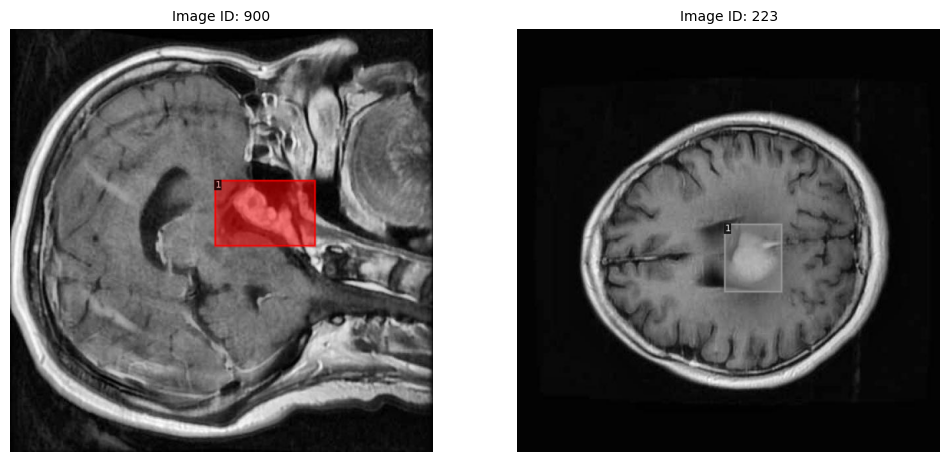

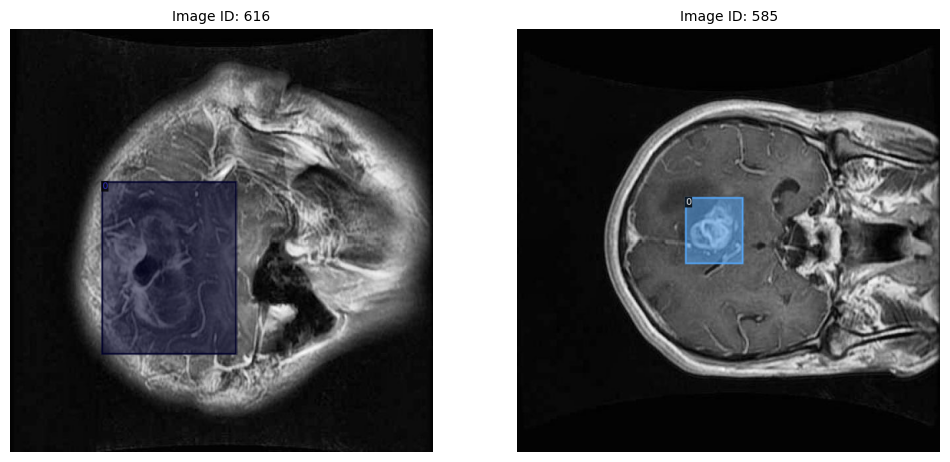

In [4]:
# Ensure matplotlib displays inline in the notebook
%matplotlib inline

# Prepare Data
import random
from detectron2.utils.visualizer import Visualizer

my_dataset_train_metadata = MetadataCatalog.get("brain_tumor_train")
train_dataset_dicts = DatasetCatalog.get("brain_tumor_train")

# A function to display examples from the dataset
def create_random_images(dataset_dict, dataset_metadata, seed, image_scale=0.7):
    np.random.seed(seed)
    images = np.random.permutation(dataset_dict)[:2]
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=100)
    for i in range(2):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        visualizer = Visualizer(img, metadata=dataset_metadata, scale=image_scale)
        vis = visualizer.draw_dataset_dict(im)
        final_img = vis.get_image()
        
        axs[i].set_title(f'Image ID: {img_id}', fontsize=10)
        axs[i].axis('off')
        axs[i].imshow(final_img)
    plt.show()

# Call function to visualize random images
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed=95, image_scale=1)
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed=99, image_scale=1)


# Train

Cuda Check

In [5]:
import torch
print(torch.cuda.is_available())  # Should return True if CUDA is available
print(torch.cuda.current_device())  # Current CUDA device ID
print(torch.cuda.get_device_name(0))  # Name of the CUDA device

True
0
NVIDIA GeForce GTX 1650 with Max-Q Design


Config model

In [6]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_train_loader, DatasetMapper
from detectron2.data import transforms as T
import os


# Set hyperparameters
EPOCHS = 3000
NUM_CLASSES = 3
BASE_LR = 0.0001

# Initializes a configuration object for the model
cfg = get_cfg()
# Loads a predefined Mask R-CNN model config with ResNeXt-101 backbone and FPN (Feature Pyramid Network) from the Detectron2 model zoo.
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))


# Sets the training dataset as 'brain_tumor_train'
cfg.DATASETS.TRAIN = ("brain_tumor_train")
# No test dataset is used in this configuration (empty)
cfg.DATASETS.TEST = ()
# Uses 2 subprocesses for data loading
cfg.DATALOADER.NUM_WORKERS = 2
# Loads pre-trained weights for the Mask R-CNN with ResNeXt-101 backbone from the model zoo.
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")

# Sets batch size to 2 images per batch for training.
cfg.SOLVER.IMS_PER_BATCH = 2
# Sets the base learning rate for training (defined earlier as 0.0001).
cfg.SOLVER.BASE_LR = BASE_LR  
# Sets the number of iterations for training (defined earlier as 3300 epochs).
cfg.SOLVER.MAX_ITER = EPOCHS    

# Number of proposals per image sent to the ROI heads.
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 
# Defines the number of classes (in this case, 3 including the background).
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

cfg.SOLVER.CHECKPOINT_PERIOD = 100  # Save a checkpoint every 100 iterations
#cfg.SOLVER.LOGGER_PERIOD = 10

# Creates the output directory for saving the trained model (if it doesn't already exist).
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

image augmentation & Train Model

In [7]:
# Define augmentations
augmentations = [
    T.Resize((640, 640)),
    T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
    T.RandomBrightness(0.8, 1.2)
]

# Create custom mapper function for applying augmentations
def custom_mapper(dataset_dict):
    dataset_dict = DatasetMapper(is_train=True, augmentations=augmentations)(dataset_dict)
    return dataset_dict


# Modify the data loader to use the custom mapper with augmentations
train_loader = build_detection_train_loader(cfg, mapper=custom_mapper)

# train
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
# trainer.checkpointer.load("/path/to/checkpoint_000090.pth")  # Manually load checkpoint 90
trainer.train()


WARNING [10/12 00:14:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/12 00:14:08 d2.data.datasets.coco]: Loaded 1502 images in COCO format from ./input/brain-tumor-image-dataset-semantic-segmentation/train/_annotations.coco.json
[10/12 00:14:08 d2.data.build]: Removed 1 images with no usable annotations. 1501 images left.


[10/12 00:14:08 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
|   Tumor    | 0            | 0          | 771          | 1          | 731          |
|            |              |            |              |            |              |
|   total    | 1502         |            |              |            |              |
[10/12 00:14:08 d2.data.build]: Using training sampler TrainingSampler
[10/12 00:14:08 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[10/12 00:14:08 d2.data.common]: Serializing 1501 elements to byte tensors and concatenating them all ...
[10/12 00:14:08 d2.data.common]: Serialized dataset takes 0.59 MiB
[10/12 00:14:08 d2.data.build]: Making batched data loader with batch_size=2
[10/12 00:14:11 d2.engine.defaults]: Model:
Gener

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (3, 256, 1, 1) 

[10/12 00:14:11 d2.engine.train_loop]: Starting training from iteration 0


c:\Users\jirap\anaconda3\Lib\site-packages\torch\functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:3610.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/12 00:18:27 d2.utils.events]:  eta: 10:30:54  iter: 19  total_loss: 2.406  loss_cls: 1.578  loss_box_reg: 0.06297  loss_mask: 0.6962  loss_rpn_cls: 0.05774  loss_rpn_loc: 0.005102    time: 13.0526  last_time: 6.2378  data_time: 0.4582  last_data_time: 0.0015   lr: 1.9981e-06  max_mem: 3913M
Falling back to TensorFlow client; we recommended you install the Cloud TPU client directly with pip install cloud-tpu-client.
Creating converter from 7 to 5
Creating converter from 5 to 7
Creating converter from 7 to 5
Creating converter from 5 to 7
Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.
[10/12 00:23:09 d2.utils.events]:  eta: 10:20:48  iter: 39  total_loss: 2.343  loss_cls: 1.493  loss_box_reg: 0.05745  loss_mask: 0.6943  loss_rpn_cls: 0.0805  loss_rpn_loc: 0.009542    time: 13.3246  last_time: 15.5348  data_time: 0.0014  last_data_time: 0.0013   lr: 3.9961e-06  max_mem: 3919M
[10/12 00:27:52 d2.utils.ev

In [8]:
# Saving the model
THRESHOLD = 0.6

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[10/12 18:50:36 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output\model_final.pth ...
[Checkpointer] Loading from ./output\model_final.pth ...


c:\Users\jirap\anaconda3\Lib\site-packages\fvcore\common\checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu

# Training Results

In [9]:
def reading_metrics_from_json(metrics_path):
    metrics = []
    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric = []
    for i in range(len(metrics)):
        try: 
            metric.append(metrics[i][specific_metric])
        except KeyError:
            pass
    return metric

In [11]:
train_metrics = reading_metrics_from_json('./output/metrics.json')

iters = metric(train_metrics, 'iteration')
total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
loss_mask = metric(train_metrics, 'loss_mask')
loss_box_reg = metric(train_metrics, 'loss_box_reg')


# checking metric lengths
if len(iters) == len(total_loss) == len(cls_acc) == len(loss_mask) == len(loss_box_reg):
    pass
else:
    iters = iters[:-1]

Text(0.5, 1.0, 'Mask Loss')

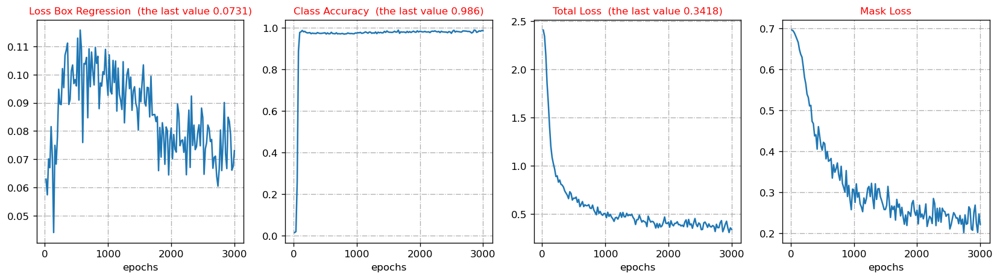

In [12]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 120)


axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, loss_mask)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('Mask Loss', fontsize = 10, color = 'red')

# Validation Predictions

In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("brain_tumor_valid", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "brain_tumor_valid")
inference_on_dataset(trainer.model, test_loader, evaluator)

[10/12 18:55:15 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [10/12 18:55:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/12 18:55:15 d2.data.datasets.coco]: Loaded 429 images in COCO format from ./input/brain-tumor-image-dataset-semantic-segmentation/valid/_annotations.coco.json
[10/12 18:55:15 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
|   Tumor    | 0            | 0          | 210          | 1          | 219          |
|            |              |            |              |            |              |
|   total    | 429          |            |              |            |              |
[10/12 18:55:15 d2.data.dataset_mapper]: [DatasetMapper] Augmentations use

OrderedDict([('bbox',
              {'AP': 40.78877928613673,
               'AP50': 75.66388392137846,
               'AP75': 40.31540921283302,
               'APs': nan,
               'APm': 34.77518921596649,
               'APl': 44.304313533553874,
               'AP-Tumor': nan,
               'AP-0': 30.070434020716323,
               'AP-1': 51.50712455155715}),
             ('segm',
              {'AP': 40.115654064232096,
               'AP50': 74.13777219113959,
               'AP75': 41.378316926336474,
               'APs': nan,
               'APm': 34.53734975428149,
               'APl': 43.318414344690474,
               'AP-Tumor': nan,
               'AP-0': 28.15253631142506,
               'AP-1': 52.078771817039126})])

In [14]:
my_dataset_test_metadata = MetadataCatalog.get("brain_tumor_valid")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("brain_tumor_valid")


# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (20,20), dpi = 120)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img[:, :, ::-1], metadata= dataset_metadata, scale=image_scale, instance_mode=ColorMode.IMAGE_BW)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 20)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 20, color = 'red')
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox[:, :, ::-1])
        
    fig.tight_layout()

WARNING [10/12 19:07:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/12 19:07:42 d2.data.datasets.coco]: Loaded 429 images in COCO format from ./input/brain-tumor-image-dataset-semantic-segmentation/valid/_annotations.coco.json


findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=9.2431640625.
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmmi10.ttf', name='cmmi10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBol.ttf', name='STIXGeneral',

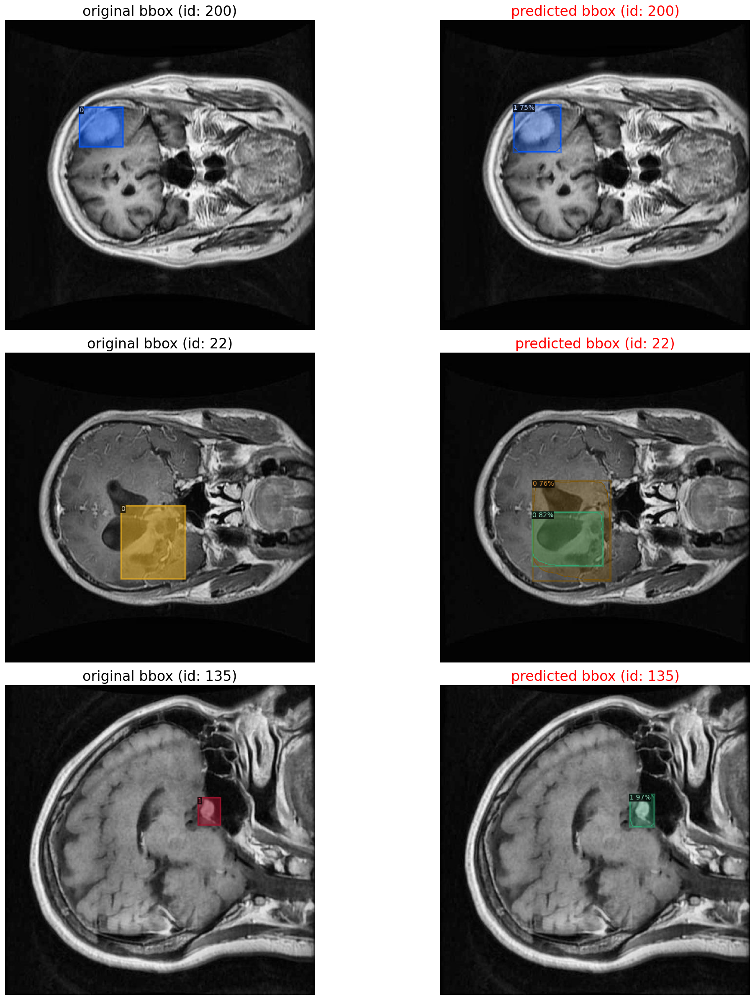

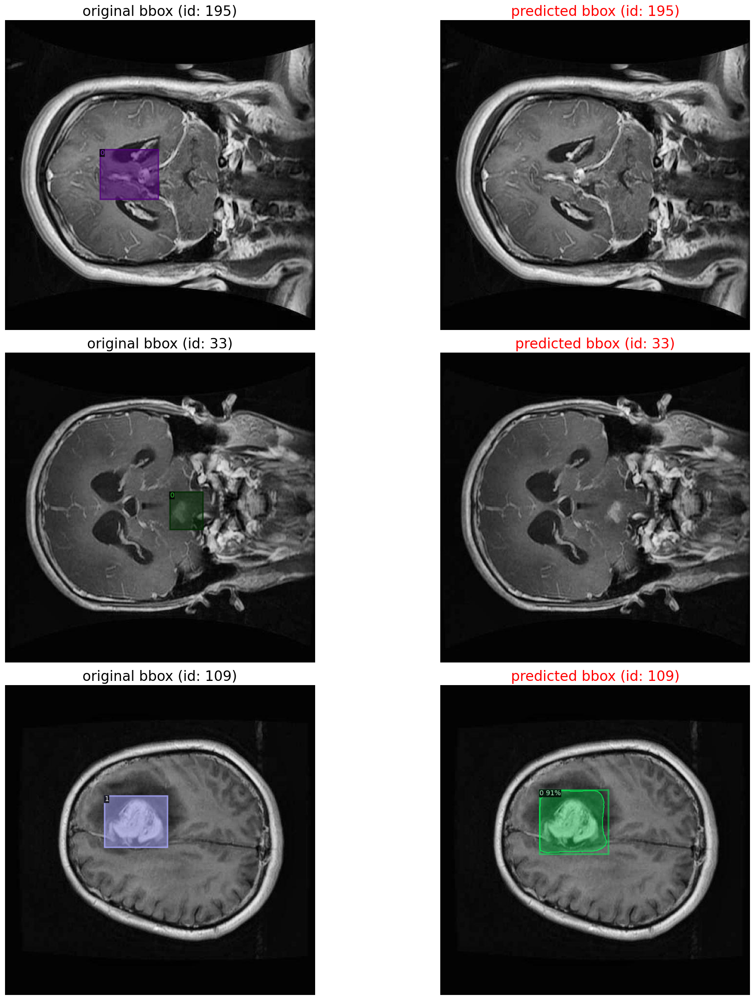

In [15]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 421, image_scale = 1)
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 83, image_scale = 1)

# Test Predictions

In [16]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("brain_tumor_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "brain_tumor_test")
inference_on_dataset(trainer.model, test_loader, evaluator)


my_dataset_test_metadata = MetadataCatalog.get("brain_tumor_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("brain_tumor_test")

[10/12 19:08:00 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [10/12 19:08:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/12 19:08:00 d2.data.datasets.coco]: Loaded 215 images in COCO format from ./input/brain-tumor-image-dataset-semantic-segmentation/test/_annotations.coco.json
[10/12 19:08:01 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
|   Tumor    | 0            | 0          | 118          | 1          | 97           |
|            |              |            |              |            |              |
|   total    | 215          |            |              |            |              |
[10/12 19:08:01 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used

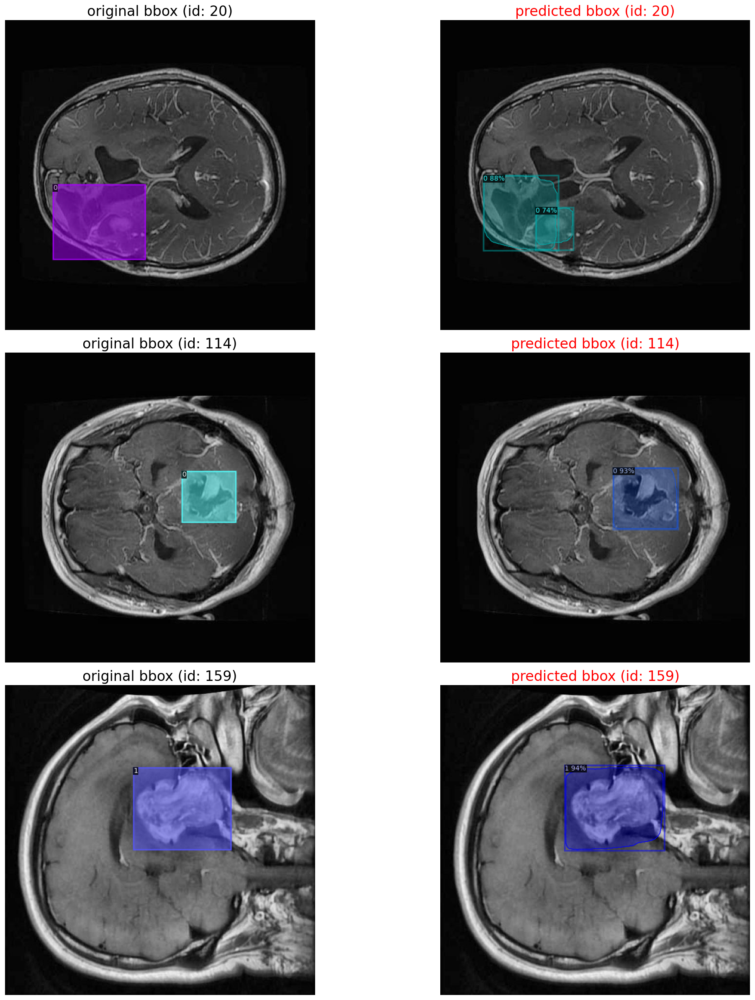

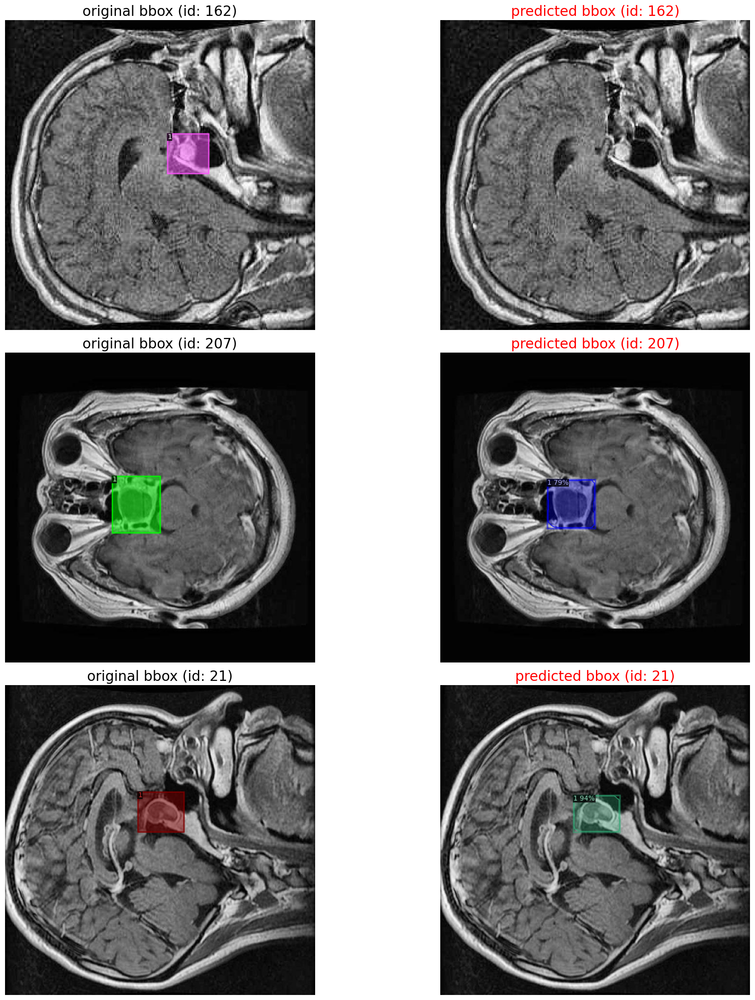

In [17]:
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 154, image_scale = 1)
create_predictions(dataset_dicts,my_dataset_test_metadata, seed = 51, image_scale = 1)

Model size & Inference Time

* Model Size: 856275776 bytes
* Average Inference time For 10 Images: 1.96634 seconds

In [18]:
# Model Size
import os
print(f"Model size: {os.path.getsize('./output/model_final.pth')} bytes")

Model size: 856275776 bytes


Inference time for image ID 0: 2.2465 seconds
Inference time for image ID 1: 2.0778 seconds
Inference time for image ID 2: 1.9176 seconds
Inference time for image ID 3: 1.9075 seconds
Inference time for image ID 4: 1.9051 seconds
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=7.412109375.
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmmi10.ttf', name='cmmi10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\jirap\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', va

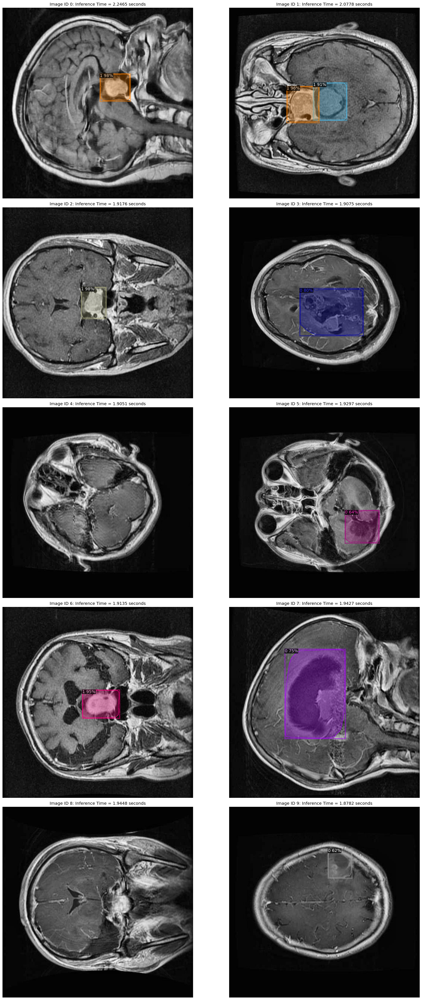

In [21]:
# Inference Time
import time
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode
import cv2
import matplotlib.pyplot as plt

# Function to compute inference time on 10 images and create predictions
def create_predictions_with_time_10(dataset_dict, dataset_metadata, predictor, image_scale=0.8):
    # Select only 10 images
    images = dataset_dict[:10]

    fig, axs = plt.subplots(5, 2, figsize=(20, 40), dpi=120)

    for i in range(10):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Measure inference time
        start_time = time.time()
        outputs = predictor(img)
        end_time = time.time()
        inference_time = end_time - start_time
        print(f"Inference time for image ID {img_id}: {inference_time:.4f} seconds")

        # Visualize original and predicted bounding boxes
        visualizer1 = Visualizer(img, metadata=dataset_metadata, scale=image_scale)
        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()

        visualizer2 = Visualizer(img[:, :, ::-1], metadata=dataset_metadata, scale=image_scale, instance_mode=ColorMode.IMAGE_BW)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)

        axs[i // 2][i % 2].set_title(f'Image ID {img_id}: Inference Time = {inference_time:.4f} seconds')
        axs[i // 2][i % 2].axis('off')
        axs[i // 2][i % 2].imshow(out_img[:, :, ::-1])

    fig.tight_layout()
    plt.show()

# Call the function with the first 10 images
create_predictions_with_time_10(dataset_dicts, my_dataset_test_metadata, predictor, image_scale=1)
